# Cognifyz Internship-Level 1
## Task 3-Geospatial Analysis

Visualize the locations of restaurants on a map using latitude and longitude information.
Analyze the distribution of restaurants across different cities or countries.
Determine if there is any correlation between the restaurant's location and its rating.

## 1. Importing necessary libararies

In [70]:
import numpy as numpy
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import warnings
warnings.filterwarnings('ignore')

## 2.Loading dataset

In [73]:
df=pd.read_csv('data.csv')
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


## 3. EDA and Preprocessing

In [76]:
df.dtypes

Restaurant ID             int64
Restaurant Name          object
Country Code              int64
City                     object
Address                  object
Locality                 object
Locality Verbose         object
Longitude               float64
Latitude                float64
Cuisines                 object
Average Cost for two      int64
Currency                 object
Has Table booking        object
Has Online delivery      object
Is delivering now        object
Switch to order menu     object
Price range               int64
Aggregate rating        float64
Rating color             object
Rating text              object
Votes                     int64
dtype: object

In [78]:
df.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes'],
      dtype='object')

In [80]:
df.describe()

,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9.551000e+03,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000
mean,9.051128e+06,18.365616,64.126574,25.854381,1199.210763,1.804837,2.666370,156.909748
std,8.791521e+06,56.750546,41.467058,11.007935,16121.183073,0.905609,1.516378,430.169145
min,5.300000e+01,1.000000,-157.948486,-41.330428,0.000000,1.000000,0.000000,0.000000
25%,3.019625e+05,1.000000,77.081343,28.478713,250.000000,1.000000,2.500000,5.000000
50%,6.004089e+06,1.000000,77.191964,28.570469,400.000000,2.000000,3.200000,31.000000
75%,1.835229e+07,1.000000,77.282006,28.642758,700.000000,2.000000,3.700000,131.000000
max,1.850065e+07,216.000000,174.832089,55.976980,800000.000000,4.000000,4.900000,10934.000000


In [82]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

In [84]:
df.isnull().sum() # Checking for null values

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64

In [86]:
df.dropna(subset=['Cuisines'],inplace=True)  # Dropping null value row from field 'Cuisine'

In [88]:
df.isnull().sum()      # Rechecking for null value 

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                0
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64

In [90]:
df['Cuisines'] = df['Cuisines'].str.split(', ')        #Splitting values in the field 'Cuisine'
df= df.explode('Cuisines')                             # Creating separate row for each value in 'Cuisine'
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,French,...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,Desserts,...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,Seafood,...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270


In [91]:
df.drop_duplicates(subset=['Longitude','Latitude'],inplace=True)        # Dropping duplicate rows from fields 'Longitude' and 'Latitude'

In [172]:
for col in df.select_dtypes(include='object'):
    df[col]=df[col].str.replace(r'[^a-zA-Z0-9,]+',"", regex=True)

# 4.Visualizing the locations of restaurants on a map using latitude and longitude information

In [95]:
# Basic map with longitude and latitude
m=folium.Map(location=[df['Longitude'].mean(),df['Latitude'].mean()],zoom_start=5)
m

In [97]:
# Displaying restaurant location with marker
for i, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup='More information', 
        tooltip=row['Restaurant Name'],
        icon=folium.Icon(color='red',icon='home')
    ).add_to(m)
m

# 5.Distribution of restaurant across City

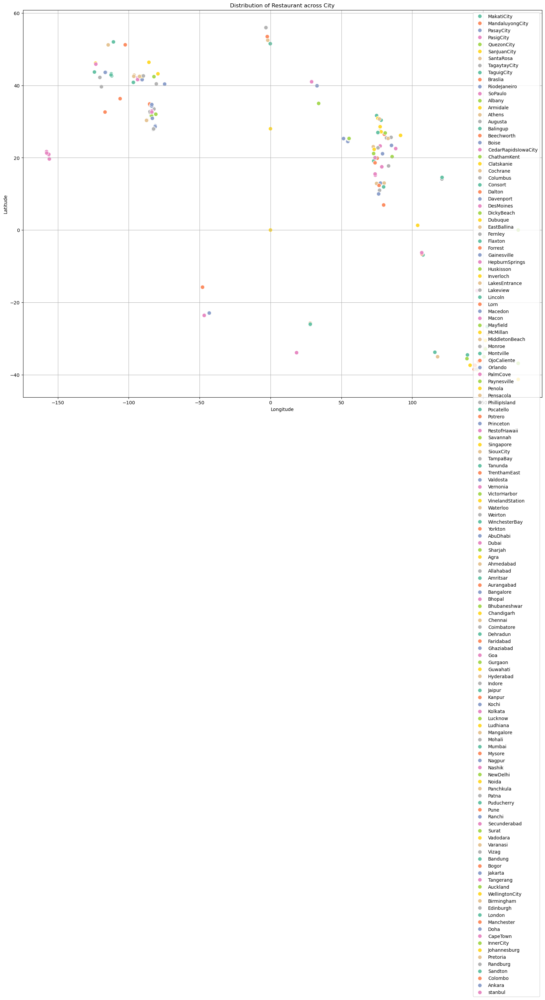

In [258]:
# Using scatter plot
plt.figure(figsize=(20,15))
sns.scatterplot(data=df,x='Longitude',y='Latitude',hue='City',alpha=1,s=70,palette='Set2')
plt.title("Distribution of Restaurant across City")
plt.legend(loc='upper right')
plt.grid()
plt.show()


In [214]:
# Distribution of top 5 restaurants in the City
top5=df['Restaurant Name'].value_counts().head(5).index   # Finding the name of top 5 restaurants
top5

Index(['DominosPizza', 'CafeCoffeeDay', 'Subway', 'GreenChickChop',
       'McDonalds'],
      dtype='object', name='Restaurant Name')

In [216]:
top5_df = df[df['Restaurant Name'].isin(top5)]   # Filtering row of top 5 restaurants
top5_df

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
672,2400014,McDonalds,1,Allahabad,"Shop4,34B,MGMarg,CivilLines,Allahabad",CivilLines,"CivilLines,Allahabad",81.834279,25.450329,FastFood,...,IndianRupeesRs,No,No,No,No,2,3.3,Orange,Average,53
709,2500134,DominosPizza,1,Aurangabad,"8,UpperGroundFloor,CityPrideCommercialComplex,...",CIDCO,"CIDCO,Aurangabad",75.340775,19.876106,Pizza,...,IndianRupeesRs,No,No,No,No,2,3.1,Orange,Average,19
876,309936,GreenChickChop,1,Faridabad,"UG58,CharmwoodPlaza,ErosGardenColony,SurajKund...",CharmwoodVillage,"CharmwoodVillage,Faridabad",77.290528,28.494680,RawMeats,...,IndianRupeesRs,No,No,No,No,1,3.0,Orange,Average,7
882,301163,McDonalds,1,Faridabad,"127,2ndFloor,CrownInteriorzMall,Sector35,Farid...","CrownInteriorzMall,Sector35,Faridabad","CrownInteriorzMall,Sector35,Faridabad,Faridabad",77.307448,28.469504,FastFood,...,IndianRupeesRs,No,No,No,No,2,3.4,Orange,Average,58
889,18408041,Subway,1,Faridabad,"SF25,2ndFloor,Sector35,Faridabad","CrownInteriorzMall,Sector35,Faridabad","CrownInteriorzMall,Sector35,Faridabad,Faridabad",77.307493,28.470002,American,...,IndianRupeesRs,No,No,No,No,2,0.0,White,Notrated,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9073,304103,CafeCoffeeDay,1,Noida,"2ndFloor,ShoppersStop,TheGreatIndiaPlaceMall,S...","TheGreatIndiaPlace,Sector38","TheGreatIndiaPlace,Sector38,Noida",77.326295,28.567871,Cafe,...,IndianRupeesRs,No,No,No,No,1,2.7,Orange,Average,18
9074,5598,CafeCoffeeDay,1,Noida,"Shop111,1stFloor,TheGreatIndiaPlaceMall,Sector...","TheGreatIndiaPlace,Sector38","TheGreatIndiaPlace,Sector38,Noida",77.326026,28.567666,Cafe,...,IndianRupeesRs,No,No,No,No,1,2.7,Orange,Average,34
9078,5619,DominosPizza,1,Noida,"302A,3rdFloor,TheGreatIndiaPlaceMall,Sector38,...","TheGreatIndiaPlace,Sector38","TheGreatIndiaPlace,Sector38,Noida",77.325555,28.567510,Pizza,...,IndianRupeesRs,No,No,No,No,2,3.2,Orange,Average,60
9081,7932,McDonalds,1,Noida,"FoodCourt,3rdFloor,TheGreatIndiaPalaceMall,Sec...","TheGreatIndiaPlace,Sector38","TheGreatIndiaPlace,Sector38,Noida",77.325308,28.567150,FastFood,...,IndianRupeesRs,No,No,No,No,2,3.4,Orange,Average,70


In [254]:
newtop5_df=top5_df.groupby(['City','Restaurant Name']).size().reset_index(name='Count')
newtop5_df

,City,Restaurant Name,Count
0,Allahabad,McDonalds,1
1,Aurangabad,DominosPizza,1
2,Faridabad,CafeCoffeeDay,1
3,Faridabad,DominosPizza,1
4,Faridabad,GreenChickChop,4
5,Faridabad,McDonalds,1
6,Faridabad,Subway,2
7,Ghaziabad,CafeCoffeeDay,1
8,Ghaziabad,DominosPizza,1
9,Ghaziabad,McDonalds,1


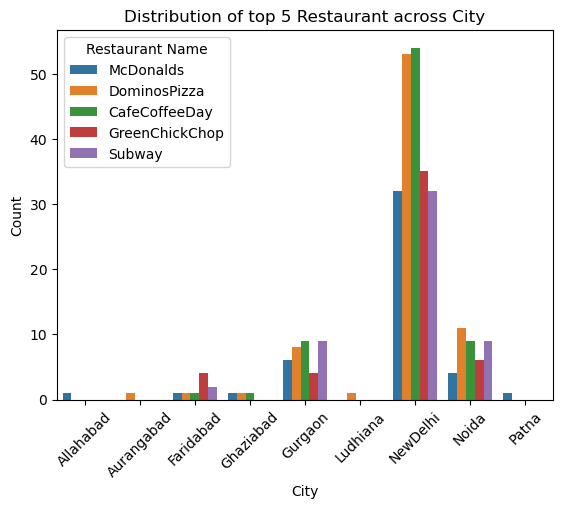

In [256]:
sns.barplot(data=newtop5_df,x='City',y='Count',hue='Restaurant Name')
plt.title("Distribution of top 5 Restaurant across City")
plt.xticks(rotation=45)
plt.show()

# 6. Correlation between restaurant location and rating

In [152]:
# Correlation Matrix
correlation=df[['Latitude','Longitude','Aggregate rating']].corr()
correlation

,Latitude,Longitude,Aggregate rating
Latitude,1.000000,-0.200691,-0.127904
Longitude,-0.200691,1.000000,-0.208681
Aggregate rating,-0.127904,-0.208681,1.000000


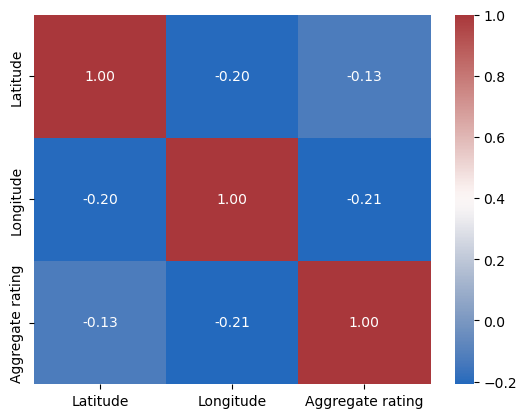

In [154]:
# visualisation of correlation using heatmap
sns.heatmap(data=correlation,annot=True,fmt='0.2f',cmap='vlag')
plt.show()

Findings and Conclusion:

- The scatter plot shows distribution of restaurant across the city.Most restaurants are highly concentrated in the latitude range of 10–30 and longitude range of 70–80.

- New Delhi has the top 5 most popular restaurants which indicates the dominace of the City in restaurant market.

- The correaltion between latitude, logitude with Aggregate Rating is less than 0.3 which indicates a weak relationship.This suggets that restaurant's location does not influence rating.
